In [ ]:


import os 
from epilepsy2bids.annotations import Annotations
from epilepsy2bids.eeg import Eeg
import numpy as np
from scipy.signal import butter, lfilter, iirnotch
import sys
from seizure_data import SeizureData
import matplotlib.pyplot as plt

In [2]:
data_root = "/Users/jjiang10/Data/EEG/BIDS_Siena"
# data_root = "/data/jjiang10/Data/EEG/BIDS_Siena"

all_cases = [case for case in os.listdir(data_root) if os.path.isdir(os.path.join(data_root, case))]

edf_file_list = []
label_file_list = []
for case in all_cases:
        data_dir = os.path.join(data_root, case)
        if not os.path.exists(data_dir):
            raise Exception("Error: Data directory does not exist.")
        for root, dirs, files in os.walk(data_dir):
            for file in files:
                if file.endswith(".edf"):

                    edf_file = os.path.join(root, file)
                    label_file = edf_file.replace("eeg.edf", "events.tsv")
                    edf_file_list.append(edf_file)
                    label_file_list.append(label_file)
print("Total number of cases: ", len(all_cases))
print("Total number of edf files: ", len(edf_file_list))



Total number of cases:  14
Total number of edf files:  41


In [3]:
def plot_eeg(eeg, label, channel_names=None):
    num_channels = eeg.shape[0] 
    num_points = eeg.shape[1]
    fig, axes = plt.subplots(num_channels, 1, sharex=True, figsize=(10, 2 * num_channels))
    for i in range(num_channels):
        axes[i].scatter(range(num_points), eeg[i, :], c=['red' if lbl else 'blue' for lbl in label], s=1)
        if channel_names:
            axes[i].set_ylabel(channel_names[i])
        else:
            axes[i].set_ylabel(f"Channel {i+1}")
        axes[i].grid(True)
    axes[-1].set_xlabel("Time")
    fig.tight_layout()
    plt.show()

Points per clip: 6400
Duration per clip: 25.0 s


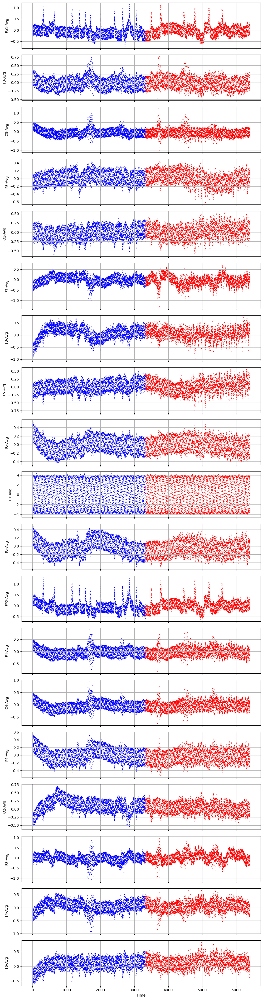

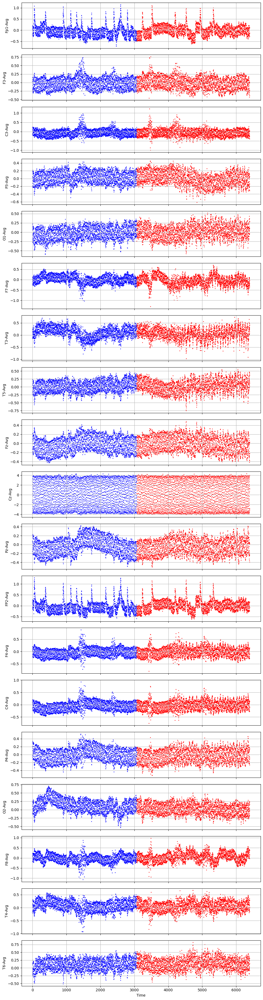

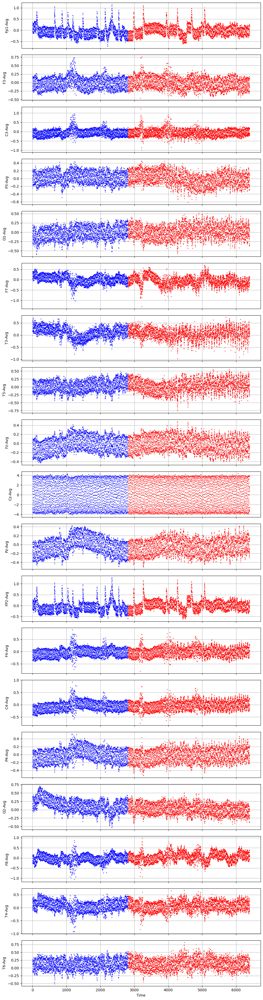

In [4]:
# Load an example file
edf_file = edf_file_list[0]
label_file = edf_file.replace("eeg.edf", "events.tsv")

eeg_data = SeizureData(edf_file, label_file)
print("Points per clip: %d"  % eeg_data.window_size)
print("Duration per clip: %.1f s" % (eeg_data.window_size/eeg_data.fs))

num_channels = eeg_data.data.shape[0] 
channel_names = eeg_data.channels

# Draw an example of seizure, and the previous and next clip
for i in range(len(eeg_data)):
    eeg_clip, mask_clip = eeg_data.get_a_clip(i)
    is_seizure =  np.mean(mask_clip) > 0.5 
    if is_seizure == True:
        eeg_clip, mask_clip = eeg_data.get_a_clip(i-1)
        plot_eeg(eeg_clip, mask_clip, channel_names)
        eeg_clip, mask_clip = eeg_data.get_a_clip(i)
        plot_eeg(eeg_clip, mask_clip, channel_names)
        eeg_clip, mask_clip = eeg_data.get_a_clip(i+1)
        plot_eeg(eeg_clip, mask_clip, channel_names)
        break




In [5]:
record_duration = eeg_data.recording_duration
events = eeg_data.annotations.events 

total_duration = 0
for event in events:
    total_duration += event["duration"]
print("Total duration of events: %.1f s" % total_duration)
for event in events:
    event_start = event["onset"]
    event_duration = event["duration"]
    event_description = event["eventType"]
    print(f"Event: {event_description}, Start: {event_start:.1f}, Duration: {event_duration:.1f}")

Total duration of events: 65.0 s
Event: EventType.sz_foc_ia, Start: 7249.0, Duration: 65.0


In [ ]:
def sample_eeg_data(eeg_data):
    fs = eeg_data.fs  # Sampling frequency
    record_duration = eeg_data.recording_duration
    events = eeg_data.annotations.events

    sampling_regions = []
    for event in events:
        event_start = event["onset"]
        event_duration = event["duration"]
        start = max(0, event_start - event_duration)  # Start of sampling region
        end = min(record_duration, event_start + 2 * event_duration)  # End of sampling region
        sampling_regions.append((start, end))

    # Remove duplicate or overlapping regions
    sampling_regions = sorted(sampling_regions, key=lambda x: x[0])
    merged_regions = []
    for region in sampling_regions:
        if not merged_regions or merged_regions[-1][1] < region[0]:
            merged_regions.append(region)
        else:
            merged_regions[-1] = (merged_regions[-1][0], max(merged_regions[-1][1], region[1]))

    # Sample the data
    sampled_eeg_data = []
    sampled_mask_data = []
    for start, end in merged_regions:
        start_idx = int(start * fs)
        end_idx = int(end * fs)
        sampled_eeg_data.append(eeg_data.data[:, start_idx:end_idx])
        sampled_mask_data.append(eeg_data.mask[start_idx:end_idx])
    return sampled_eeg_data, sampled_mask_data


In [75]:
sampled_clips, mask_clips = sample_eeg_data(eeg_data)
print(f"Number of sampled clips: {len(sampled_clips)}")

sv_dir = "/Users/jjiang10/Data/EEG/BIDS_Siena_pred"
eeg_data_fn = eeg_data.edf_file
file_name = os.path.basename(eeg_data_fn).replace(".edf", "")
sv_fn = os.path.join(sv_dir, f"{file_name}_list_of_eeg_and_mask_clip.npy")

np.save(sv_fn, {"sampled_clips": [clip for clip in sampled_clips], "mask_clips": [mask for mask in mask_clips]})


Number of sampled clips: 1


In [ ]:

for edf_file, label_file in zip(edf_file_list, label_file_list):
    print("processing %s" % edf_file)
    eeg_data = SeizureData(edf_file, label_file)
    sampled_clips, mask_clips = sample_eeg_data(eeg_data)
    print("Number of sampled clips: %d" % len(sampled_clips))
    eeg_data_fn = eeg_data.edf_file
    file_name = os.path.basename(eeg_data_fn).replace(".edf", "")
    sv_fn = os.path.join(sv_dir, f"{file_name}_list_of_eeg_and_mask_clip.npy")
    if os.path.exists(sv_fn):
        print("File already exist")
    np.save(sv_fn, {"sampled_clips": [clip for clip in sampled_clips], "mask_clips": [mask for mask in mask_clips]}, allow_pickle=True)



processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-13/ses-01/eeg/sub-13_ses-01_task-szMonitoring_run-01_eeg.edf
Number of sampled clips: 1
File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-13/ses-01/eeg/sub-13_ses-01_task-szMonitoring_run-00_eeg.edf
Number of sampled clips: 1
File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-13/ses-01/eeg/sub-13_ses-01_task-szMonitoring_run-02_eeg.edf
Number of sampled clips: 1
File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-14/ses-01/eeg/sub-14_ses-01_task-szMonitoring_run-02_eeg.edf
Number of sampled clips: 1
File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-14/ses-01/eeg/sub-14_ses-01_task-szMonitoring_run-03_eeg.edf
Number of sampled clips: 1
File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-14/ses-01/eeg/sub-14_ses-01_task-szMonitoring_run-01_eeg.edf
Number of sampled clips: 1
File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-1

3


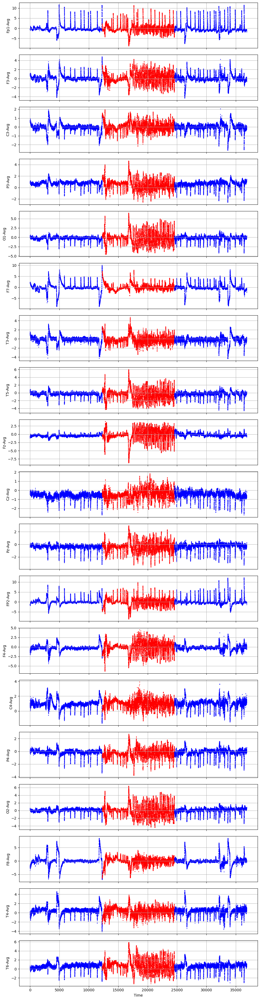

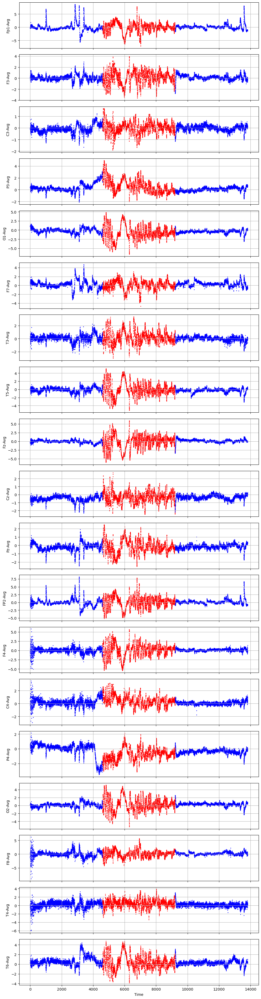

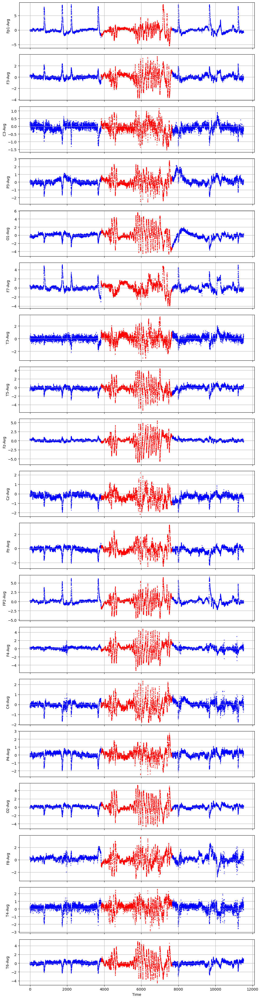

In [86]:
# edf_file = "/Users/jjiang10/Data/EEG/BIDS_Siena/sub-01/ses-01/eeg/sub-01_ses-01_task-szMonitoring_run-00_eeg.edf"
edf_file = "/Users/jjiang10/Data/EEG/BIDS_Siena/sub-12/ses-01/eeg/sub-10_ses-01_task-szMonitoring_run-05_eeg.edf"
file_name = os.path.basename(edf_file).replace(".edf", "")
filtered_eeg_data_file = os.path.join(sv_dir, f"{file_name}_list_of_eeg_and_mask_clip.npy")

data = np.load(filtered_eeg_data_file, allow_pickle=True).item()

print(len(data['sampled_clips']))
# Extract an example clip and its corresponding mask
for i in range(len(data['sampled_clips'])):
    example_clip = data['sampled_clips'][i]
    example_mask = data['mask_clips'][i]

    # Plot the example clip
    plot_eeg(example_clip, example_mask, channel_names)





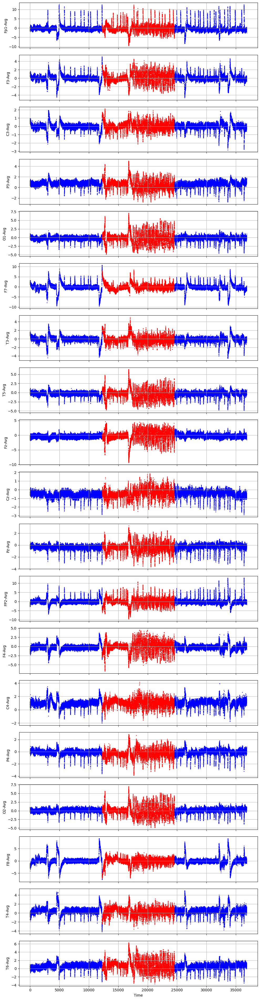

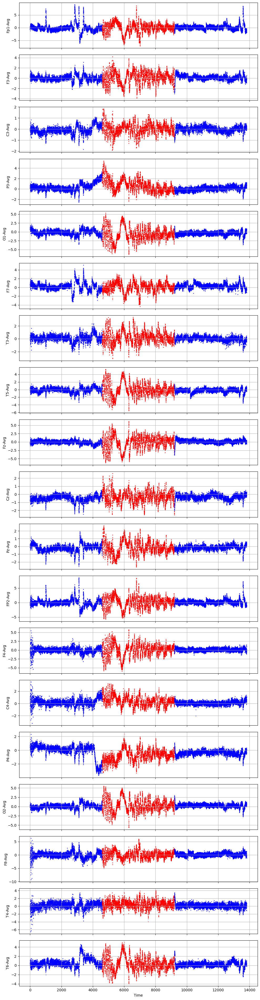

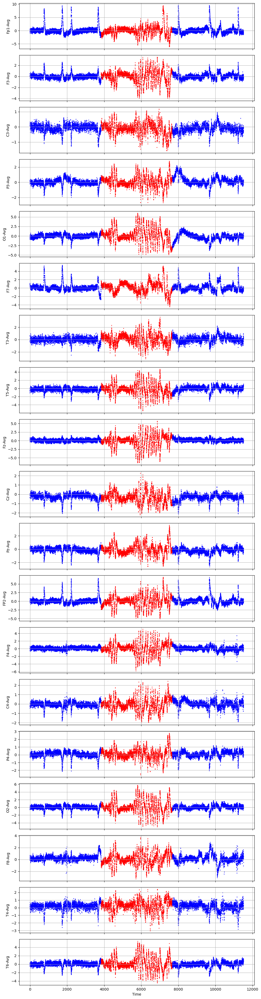

In [ ]:
# Example of noisy EEG data (data augmentation)
for i in range(len(data['sampled_clips'])):
    example_clip = data['sampled_clips'][i]
    example_mask = data['mask_clips'][i]

    # Add random noise to each row of the example_clip
    noisy_example_clip = example_clip.copy()
    for i in range(noisy_example_clip.shape[0]):
        max_val = np.max(np.abs(noisy_example_clip[i, :]))
        noise = np.random.uniform(-0.1 * max_val, 0.1 * max_val, noisy_example_clip.shape[1])
        noisy_example_clip[i, :] += noise

    # Plot the noisy EEG data
    plot_eeg(noisy_example_clip, example_mask, channel_names)



In [82]:
fn_list = os.listdir(sv_dir)
for fn in fn_list:
    if not fn.endswith(".npy"):
        continue
    filtered_eeg_data_file = os.path.join(sv_dir, fn)
    data = np.load(filtered_eeg_data_file, allow_pickle=True).item()
    sample_cnt = len(data['sampled_clips'])
    if sample_cnt > 1:
        print(sample_cnt)
        print(filtered_eeg_data_file)


3
/Users/jjiang10/Data/EEG/BIDS_Siena_pred/sub-10_ses-01_task-szMonitoring_run-05_eeg_list_of_eeg_and_mask_clip.npy
2
/Users/jjiang10/Data/EEG/BIDS_Siena_pred/sub-12_ses-01_task-szMonitoring_run-00_eeg_list_of_eeg_and_mask_clip.npy
2
/Users/jjiang10/Data/EEG/BIDS_Siena_pred/sub-01_ses-01_task-szMonitoring_run-00_eeg_list_of_eeg_and_mask_clip.npy
3
/Users/jjiang10/Data/EEG/BIDS_Siena_pred/sub-10_ses-01_task-szMonitoring_run-04_eeg_list_of_eeg_and_mask_clip.npy


In [97]:
# Re-save the npy file, save only one event in each npy file

for edf_file, label_file in zip(edf_file_list, label_file_list):
    print("processing %s" % edf_file)
    eeg_data = SeizureData(edf_file, label_file)
    fs = eeg_data.eeg.fs
    print(fs)
    sampled_clips, mask_clips = sample_eeg_data(eeg_data)
    print("Number of sampled clips: %d" % len(sampled_clips))
    eeg_data_fn = eeg_data.edf_file
    file_name = os.path.basename(eeg_data_fn).replace(".edf", "")
    if os.path.exists(sv_fn):
        print("Warning. File already exist")
    for i in range(len(sampled_clips)):
        sv_fn = os.path.join(sv_dir, f"{file_name}_list_of_eeg_and_mask_clip_" + str(i) +".npy")
        np.save(sv_fn, {"sampled_clips": sampled_clips[i], "mask_clips": mask_clips[i], "fs": fs}, allow_pickle=True)



processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-13/ses-01/eeg/sub-13_ses-01_task-szMonitoring_run-01_eeg.edf
256.0
Number of sampled clips: 1
Warning. File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-13/ses-01/eeg/sub-13_ses-01_task-szMonitoring_run-00_eeg.edf
256.0
Number of sampled clips: 1
Warning. File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-13/ses-01/eeg/sub-13_ses-01_task-szMonitoring_run-02_eeg.edf
256.0
Number of sampled clips: 1
Warning. File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-14/ses-01/eeg/sub-14_ses-01_task-szMonitoring_run-02_eeg.edf
256.0
Number of sampled clips: 1
Warning. File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-14/ses-01/eeg/sub-14_ses-01_task-szMonitoring_run-03_eeg.edf
256.0
Number of sampled clips: 1
Warning. File already exist
processing /Users/jjiang10/Data/EEG/BIDS_Siena/sub-14/ses-01/eeg/sub-14_ses-01_task-szMonitoring_run-01_eeg.edf
256.0
Number of sampled